In [1]:
# Import libraries
import numpy as np
import math
import random
import pandas as pd

import scipy.stats as stats
from statsmodels.stats.multitest import multipletests

import statsmodels.api as sm # linear regression

import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

import scanpy as sc
import scanpy.external as sce
from gprofiler import GProfiler

import os

# Directory path
myDir = "/Users/junjie/Desktop/OneDrive - The University of Chicago (1)/Python"
os.chdir(myDir)
import ProxseqClasses as PC
import calculateweightedPPI as WPPI
import ProxseqFunctions as PF

#*****
mpl.rcdefaults()
# Set font to be arial
mpl.rc('font', **{'sans-serif':'Arial', 'size':12})
mpl.rcParams['mathtext.rm'] = 'sans' # to have non-italic greek letter, use r'$\mathrm{\alpha}$', does NOT work with f-string
mpl.rcParams['axes.titlesize'] = 12
# Set default tick size
mpl.rcParams['xtick.major.size'] = 5.5
mpl.rcParams['ytick.major.size'] = 5.5
mpl.rcParams['xtick.minor.size'] = 2.5
mpl.rcParams['ytick.minor.size'] = 2.5
# Default legend settings
mpl.rcParams['legend.fancybox'] = False
mpl.rcParams['legend.edgecolor'] = 'k'

#to store text as text, not as path
new_rc_params = {'text.usetex': False,
                 "svg.fonttype": 'none'}
mpl.rcParams.update(new_rc_params)
#*****
# Seed number
np.random.seed(2025)
random.seed(2025)

In [2]:
#read singleR and azimuth annotation
singler_ctrl = pd.read_csv("GPS/20250521/Ctrl_singleR_annotation.csv", index_col=0)
singler_cona = pd.read_csv("GPS/20250521/ConA_singleR_annotation.csv", index_col=0)

In [3]:
#keep canonical cell types
singler_ctrl['singleR_ann_l2'] = singler_ctrl['singleR_ann_l2'].replace({
    'Hematopoietic stem cells_CD133+ CD34dim': 'Other',
    'Granulocytes (Neutrophils)': 'Other',
    'Erythroid_CD34+ CD71+ GlyA-': 'Other',
    'Megakaryocyte/erythroid progenitors': 'Other',
    'Common myeloid progenitors': 'Other',
    'Plasmacytoid Dendritic Cells': 'Dendritic Cells',
    'Myeloid Dendritic Cells': 'Dendritic Cells',
    'Naive B cells': 'B cells',
    'Mature B cells class switched': 'B cells',
    'Mature B cells class able to switch': 'B cells'
})
singler_cona['singleR_ann_l2'] = singler_cona['singleR_ann_l2'].replace({
    'Hematopoietic stem cells_CD133+ CD34dim': 'Other',
    'Granulocytes (Neutrophils)': 'Other',
    'Erythroid_CD34+ CD71+ GlyA-': 'Other',
    'Megakaryocyte/erythroid progenitors': 'Other',
    'Common myeloid progenitors': 'Other',
    'Plasmacytoid Dendritic Cells': 'Dendritic Cells',
    'Myeloid Dendritic Cells': 'Dendritic Cells',
    'Naive B cells': 'B cells',
    'Mature B cells class switched': 'B cells',
    'Mature B cells class able to switch': 'B cells',
    'Colony Forming Unit-Granulocytes':'Other',
    'Colony Forming Unit-Megakaryocytic':'Other'
})


In [4]:
#merge for major cell types
singler_ctrl['singleR_ann_l1'] = singler_ctrl['singleR_ann_l1'].replace({
    'HSCs': 'Other',
    'MEPs': 'Other',
    'Granulocytes': 'Other',
    'NK T cells':'NK cells'
})

singler_cona['singleR_ann_l1'] = singler_cona['singleR_ann_l1'].replace({
    'HSCs': 'Other',
    'MEPs': 'Other',
    'Granulocytes': 'Other',
    'NK T cells':'NK cells',
    'CMPs':'Other',
    'Erythroid cells':'Other'
})

In [5]:
#load datasets
adata_ctrl = sc.read_10x_mtx('GPS/20250521/Ctrl_filtered_feature_bc_matrix',cache=True)
#data preprocessing 
adata_ctrl.var['mt'] = adata_ctrl.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_ctrl, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [6]:
#preprocessing for ctrl
#perform UMI based filter
sc.pp.filter_cells(adata_ctrl, min_counts = 1200)

sc.pp.filter_cells(adata_ctrl, max_counts=30000)

sc.pp.filter_genes(adata_ctrl, min_cells=3)

adata_ctrl = adata_ctrl[adata_ctrl.obs['n_genes_by_counts'] >= 200]
#perform MT gene based filter
adata_ctrl = adata_ctrl[adata_ctrl.obs["pct_counts_mt"] < 20]

#map annotations
adata_ctrl.obs['singler_ann_l1'] = singler_ctrl['singleR_ann_l1']
adata_ctrl.obs['singler_ann_l2'] = singler_ctrl['singleR_ann_l2']

/var/folders/3m/mdf183dx4b79fpz1v51zf93w0000gn/T/ipykernel_75631/1616599736.py:14: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_ctrl.obs['singler_ann_l1'] = singler_ctrl['singleR_ann_l1']


In [7]:
#load datasets
adata_cona = sc.read_10x_mtx('GPS/20250521/ConA_filtered_feature_bc_matrix',cache=True)
#data preprocessing 
adata_cona.var['mt'] = adata_cona.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_cona, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [8]:
#preprocessing for cona
#perform UMI based filter
sc.pp.filter_cells(adata_cona, min_counts = 2000)

sc.pp.filter_cells(adata_cona, max_counts=30000)

sc.pp.filter_genes(adata_cona, min_cells=3)

adata_cona = adata_cona[adata_cona.obs['n_genes_by_counts'] >= 200]
#perform MT gene based filter
adata_cona = adata_cona[adata_cona.obs["pct_counts_mt"] < 20]

#map annotation
adata_cona.obs['singler_ann_l1'] = singler_cona['singleR_ann_l1']
adata_cona.obs['singler_ann_l2'] = singler_cona['singleR_ann_l2']

/var/folders/3m/mdf183dx4b79fpz1v51zf93w0000gn/T/ipykernel_75631/4011515497.py:14: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_cona.obs['singler_ann_l1'] = singler_cona['singleR_ann_l1']


In [9]:
adata_ctrl.obs['condition'] = 'control'
adata_cona.obs['condition'] = 'stimulated'
adata_ctrl.obs_names_make_unique()
adata_cona.obs_names_make_unique()

In [10]:
adata = adata_ctrl.concatenate(adata_cona, batch_key="condition", index_unique=None)
adata.obs['condition'] = adata.obs['condition'].map({'0': 'control', '1': 'stimulated'})
adata.obs_names_make_unique()

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/anndata/_core/anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [11]:
adata.layers["counts"] = adata.X.copy() # preserve counts
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata.raw = adata.copy() # freeze the state in `.raw`
sc.pp.highly_variable_genes(adata, n_top_genes=4000, batch_key='condition')
adata = adata[:, adata.var['highly_variable']]
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:485: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  hvg = pd.concat([hvg, missing_hvg], ignore_index=True)
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/preprocessing/_highly_var

In [16]:
#sc.external.pp.bbknn(adata, batch_key="condition")

In [12]:
sce.pp.harmony_integrate(adata, "condition")

2025-07-22 16:49:52,297 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-07-22 16:49:57,134 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-07-22 16:49:57,179 - harmonypy - INFO - Iteration 1 of 10
2025-07-22 16:49:59,765 - harmonypy - INFO - Iteration 2 of 10
2025-07-22 16:50:02,002 - harmonypy - INFO - Converged after 2 iterations


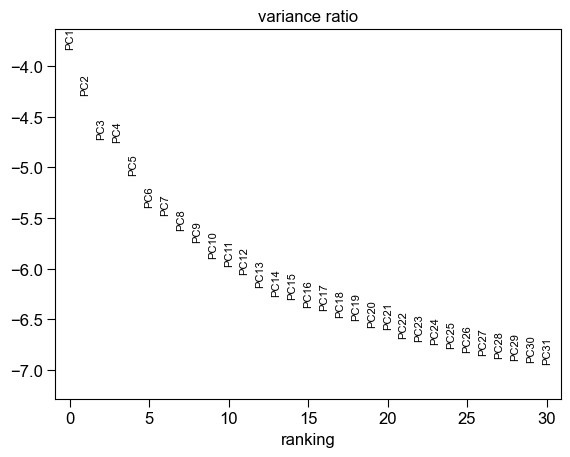

In [13]:
sc.pl.pca_variance_ratio(adata, log=True)

In [14]:
sc.pp.neighbors(adata, use_rep='X_pca_harmony',n_neighbors=10, n_pcs=30)
sc.tl.umap(adata) 

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

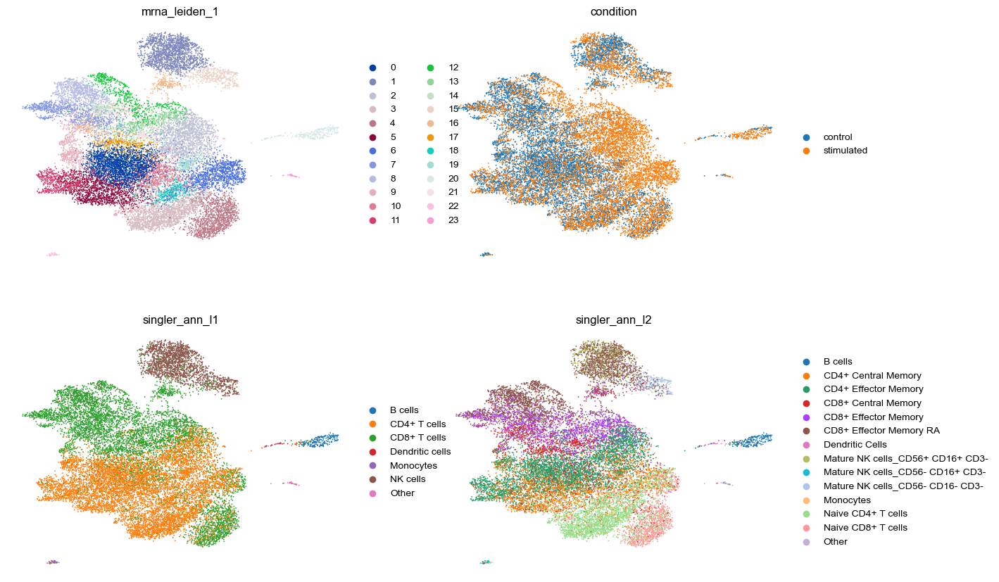

In [15]:
sc.tl.leiden(adata, resolution = 1, key_added='mrna_leiden_1') # resolution is customly chosen
sc.pl.umap(adata, color=['mrna_leiden_1','condition','singler_ann_l1','singler_ann_l2'],ncols=2,frameon=False, legend_fontweight='normal', legend_fontsize=10)

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

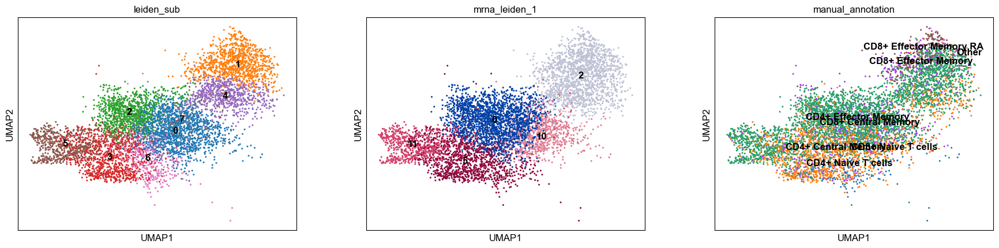

In [71]:
#take cluster for reclustring
subset_clusters = ['0','2','5','10','11']
adata_sub = adata[adata.obs['mrna_leiden_1'].isin(subset_clusters)].copy()
# Step 3: Reclustering with Leiden
sc.tl.leiden(adata_sub, resolution=0.6, key_added='leiden_sub')

# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['leiden_sub','mrna_leiden_1','manual_annotation'], legend_loc='on data')

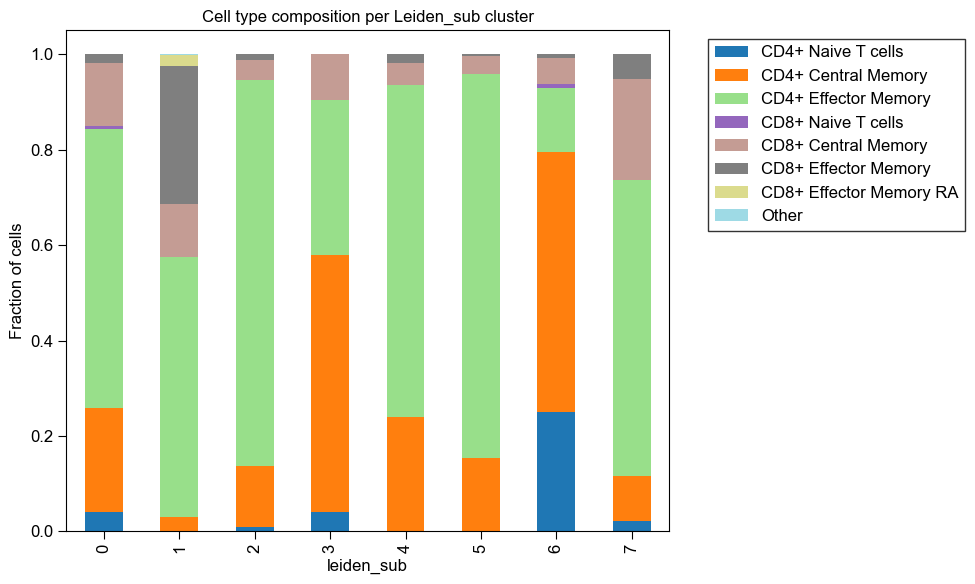

In [72]:
#check in the subcluster, the numbers of each cluster for each cell type
# Cross-tabulate: how cell types distribute across sub-Leiden clusters
ct = pd.crosstab(adata_sub.obs['leiden_sub'], adata_sub.obs['manual_annotation'], normalize='index')
ct.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.ylabel("Fraction of cells")
plt.title("Cell type composition per Leiden_sub cluster")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

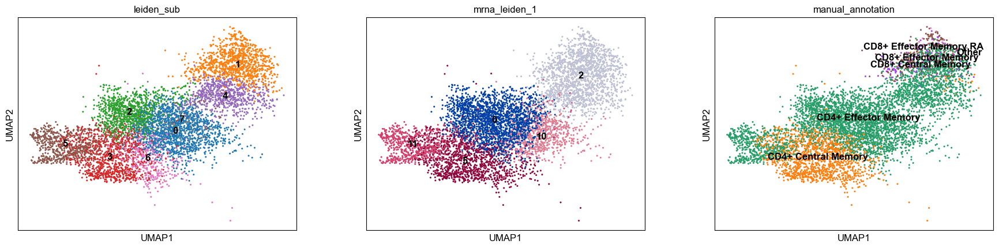

In [73]:
#update manual annotation in the sub 
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['0','2', '4', '5','7']), 'manual_annotation'] = 'CD4+ Effector Memory'
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['3', '6']), 'manual_annotation'] = 'CD4+ Central Memory'
#1 needed to be reclustered
# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['leiden_sub','mrna_leiden_1','manual_annotation'], legend_loc='on data')

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

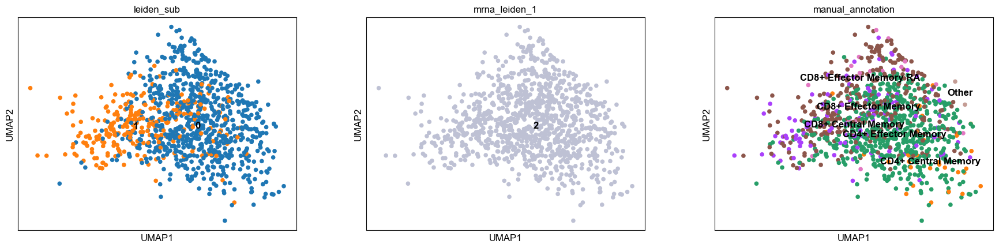

In [77]:
#take subcluster for reclustering
subset2_clusters = ['1']
adata_sub2 = adata_sub[adata_sub.obs['leiden_sub'].isin(subset2_clusters)].copy()
# Step 3: Reclustering with Leiden
sc.tl.leiden(adata_sub2, resolution=0.2, key_added='leiden_sub')

# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub2, color=['leiden_sub','mrna_leiden_1','manual_annotation'], legend_loc='on data')

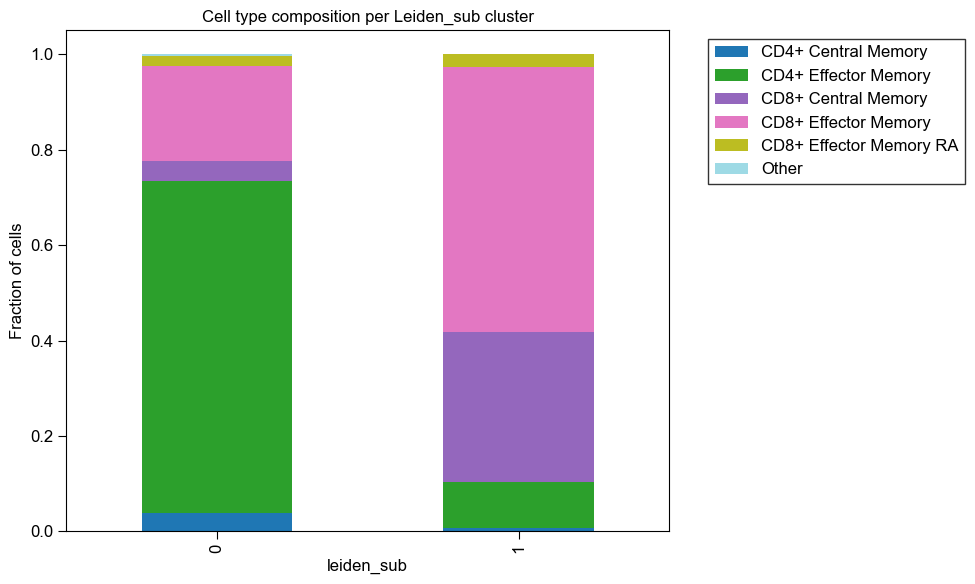

In [78]:
#check in the subcluster, the numbers of each cluster for each cell type
# Cross-tabulate: how cell types distribute across sub-Leiden clusters
ct = pd.crosstab(adata_sub2.obs['leiden_sub'], adata_sub2.obs['manual_annotation'], normalize='index')
ct.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.ylabel("Fraction of cells")
plt.title("Cell type composition per Leiden_sub cluster")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

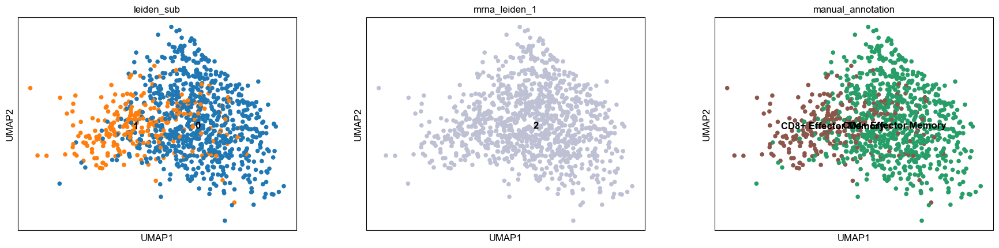

In [79]:
#update manual annotation in the sub2 
adata_sub2.obs.loc[adata_sub2.obs['leiden_sub'].isin(['0']), 'manual_annotation'] = 'CD4+ Effector Memory'
adata_sub2.obs.loc[adata_sub2.obs['leiden_sub'].isin(['1']), 'manual_annotation'] = 'CD8+ Effector Memory'

# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub2, color=['leiden_sub','mrna_leiden_1','manual_annotation'], legend_loc='on data')

In [85]:
#record the manual annotation information
# Map from adata_sub2 to adata_sub
adata_sub.obs.loc[adata_sub2.obs_names, 'manual_annotation'] = adata_sub2.obs['manual_annotation'].astype(str)

# Then map from adata_sub to adata
adata.obs['manual_annotation_reclustered'] = adata.obs['manual_annotation']  # create backup column in adata
adata.obs.loc[adata_sub.obs_names, 'manual_annotation_reclustered'] = adata_sub.obs['manual_annotation'].astype(str)

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

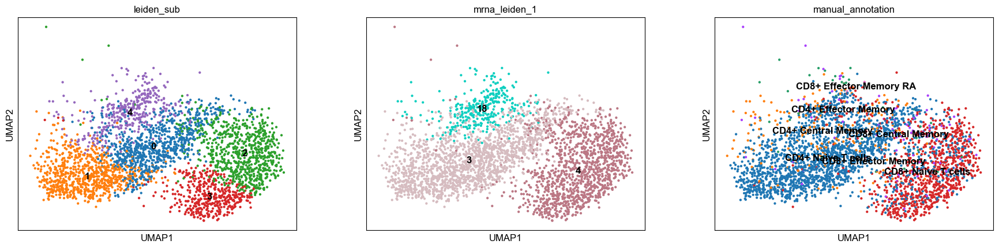

In [97]:
# Step 1: Subset new clusters
subset_clusters = ['3', '4', '18']
adata_sub = adata[adata.obs['mrna_leiden_1'].isin(subset_clusters)].copy()

# Step 2: Reclustering
sc.tl.leiden(adata_sub, resolution=0.5, key_added='leiden_sub')

# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['leiden_sub','mrna_leiden_1','manual_annotation'], legend_loc='on data')

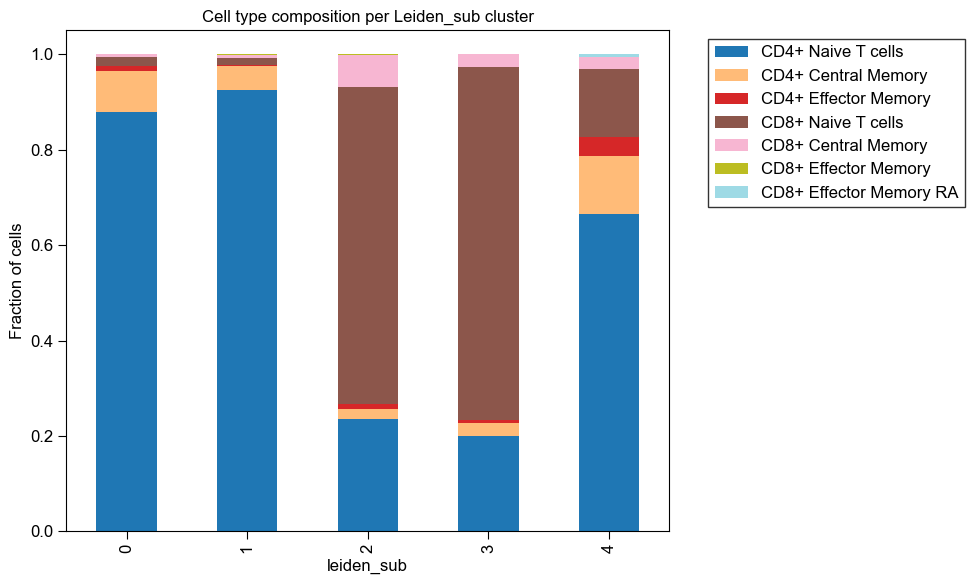

In [98]:
#check in the subcluster, the numbers of each cluster for each cell type
# Cross-tabulate: how cell types distribute across sub-Leiden clusters
ct = pd.crosstab(adata_sub.obs['leiden_sub'], adata_sub.obs['manual_annotation'], normalize='index')
ct.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.ylabel("Fraction of cells")
plt.title("Cell type composition per Leiden_sub cluster")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


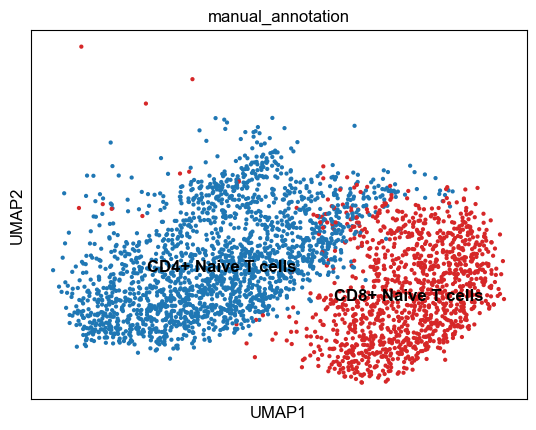

In [99]:
#update manual annotation in the sub 
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['2', '3']), 'manual_annotation'] = 'CD8+ Naive T cells'
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['0', '1', '4']), 'manual_annotation'] = 'CD4+ Naive T cells'
# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['manual_annotation'], legend_loc='on data')

In [100]:
# Step 5: Map back to original adata
adata.obs.loc[adata_sub.obs_names, 'manual_annotation_reclustered'] = adata_sub.obs['manual_annotation'].astype(str)

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

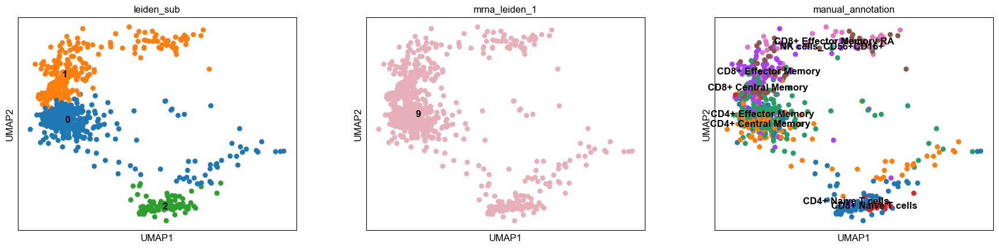

In [104]:
#take cluster for reclustring
subset_clusters = ['9']
adata_sub = adata[adata.obs['mrna_leiden_1'].isin(subset_clusters)].copy()
# Step 3: Reclustering with Leiden
sc.tl.leiden(adata_sub, resolution=0.3, key_added='leiden_sub')

# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['leiden_sub','mrna_leiden_1','manual_annotation'], legend_loc='on data')

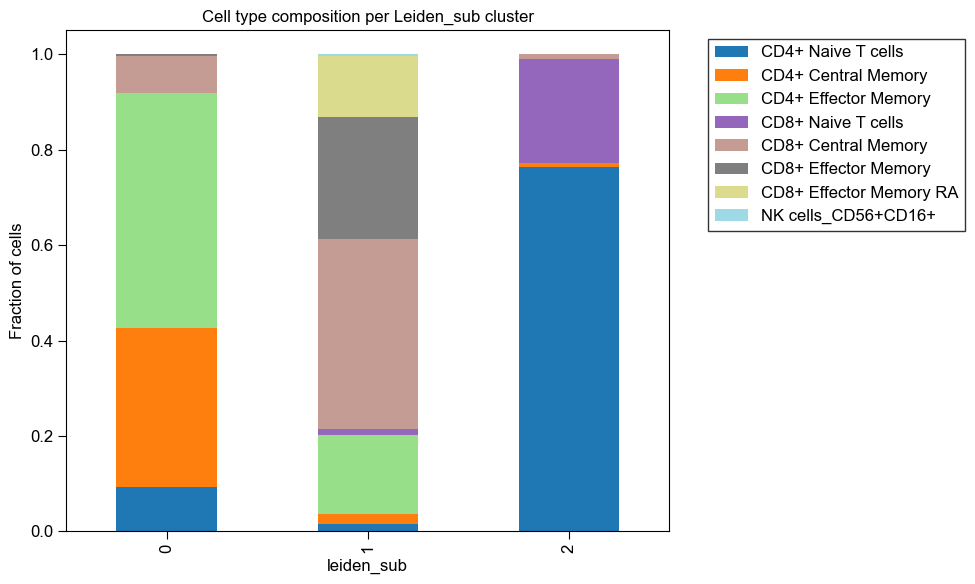

In [105]:
#check in the subcluster, the numbers of each cluster for each cell type
# Cross-tabulate: how cell types distribute across sub-Leiden clusters
ct = pd.crosstab(adata_sub.obs['leiden_sub'], adata_sub.obs['manual_annotation'], normalize='index')
ct.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.ylabel("Fraction of cells")
plt.title("Cell type composition per Leiden_sub cluster")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


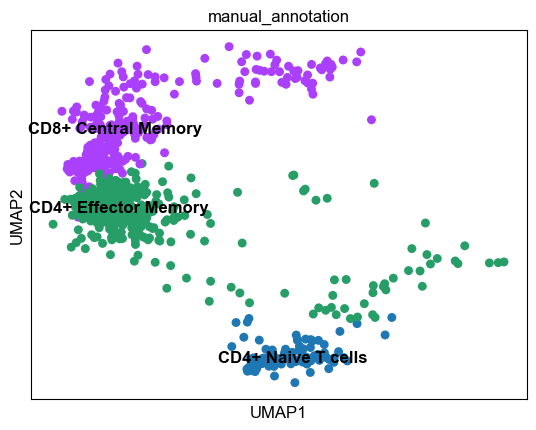

In [106]:
#update manual annotation in the sub 
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['2']), 'manual_annotation'] = 'CD4+ Naive T cells'
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['1']), 'manual_annotation'] = 'CD8+ Central Memory'
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['0']), 'manual_annotation'] = 'CD4+ Effector Memory'
# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['manual_annotation'], legend_loc='on data')

In [107]:
# Step 5: Map back to original adata
adata.obs.loc[adata_sub.obs_names, 'manual_annotation_reclustered'] = adata_sub.obs['manual_annotation'].astype(str)

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

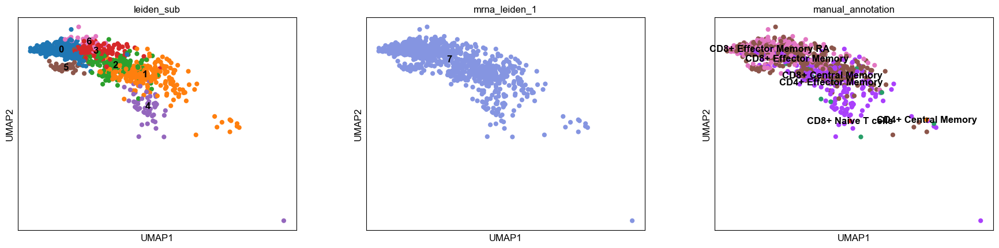

In [156]:
#take cluster for reclustring
subset_clusters = ['7']
adata_sub = adata[adata.obs['mrna_leiden_1'].isin(subset_clusters)].copy()
# Step 3: Reclustering with Leiden
sc.tl.leiden(adata_sub, resolution=0.6, key_added='leiden_sub')

# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['leiden_sub','mrna_leiden_1','manual_annotation'], legend_loc='on data')

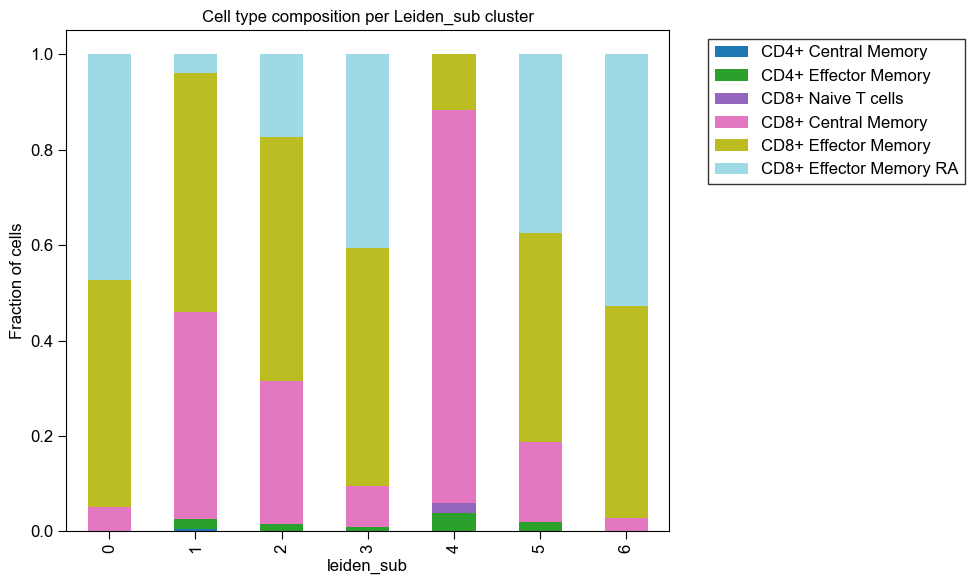

In [157]:
#check in the subcluster, the numbers of each cluster for each cell type
# Cross-tabulate: how cell types distribute across sub-Leiden clusters
ct = pd.crosstab(adata_sub.obs['leiden_sub'], adata_sub.obs['manual_annotation'], normalize='index')
ct.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.ylabel("Fraction of cells")
plt.title("Cell type composition per Leiden_sub cluster")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


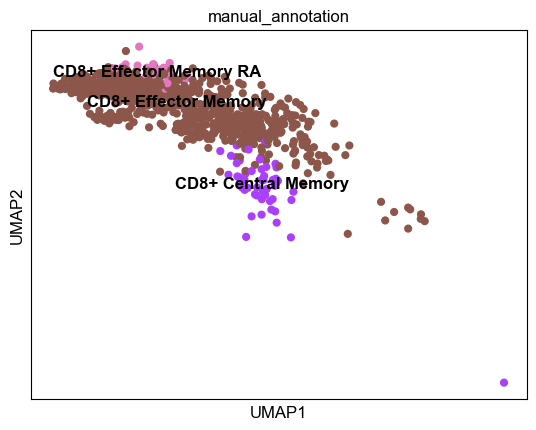

In [158]:
#update manual annotation in the sub 
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['0','1','2','3','5']), 'manual_annotation'] = 'CD8+ Effector Memory'
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['4']), 'manual_annotation'] = 'CD8+ Central Memory'
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['6']), 'manual_annotation'] = 'CD8+ Effector Memory RA'
# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['manual_annotation'], legend_loc='on data')

In [159]:
# Step 5: Map back to original adata
adata.obs.loc[adata_sub.obs_names, 'manual_annotation_reclustered'] = adata_sub.obs['manual_annotation'].astype(str)

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

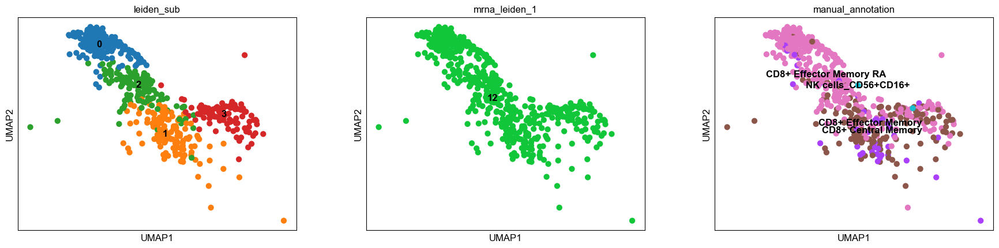

In [161]:
#take cluster for reclustring
subset_clusters = ['12']
adata_sub = adata[adata.obs['mrna_leiden_1'].isin(subset_clusters)].copy()
# Step 3: Reclustering with Leiden
sc.tl.leiden(adata_sub, resolution=0.3, key_added='leiden_sub')

# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['leiden_sub','mrna_leiden_1','manual_annotation'], legend_loc='on data')

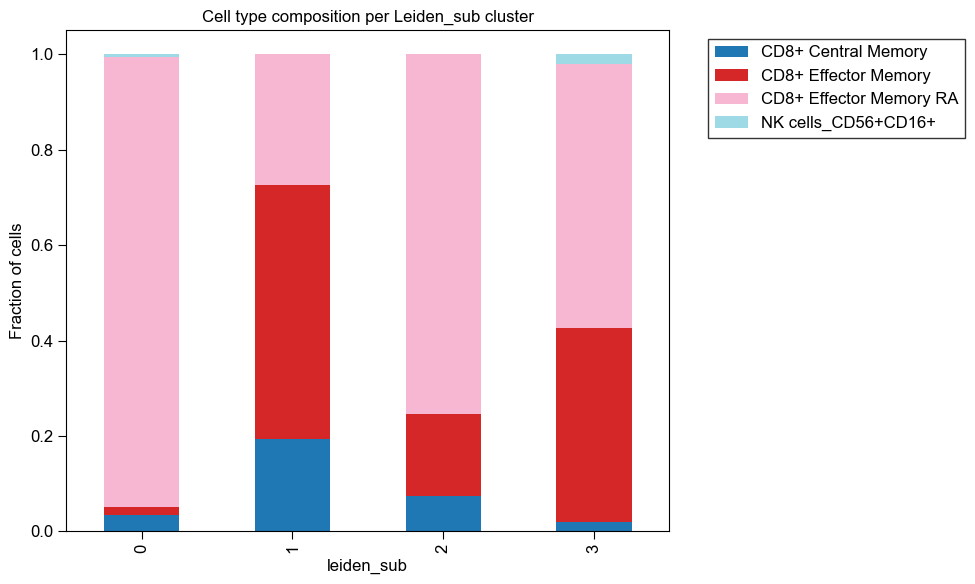

In [162]:
#check in the subcluster, the numbers of each cluster for each cell type
# Cross-tabulate: how cell types distribute across sub-Leiden clusters
ct = pd.crosstab(adata_sub.obs['leiden_sub'], adata_sub.obs['manual_annotation'], normalize='index')
ct.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.ylabel("Fraction of cells")
plt.title("Cell type composition per Leiden_sub cluster")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


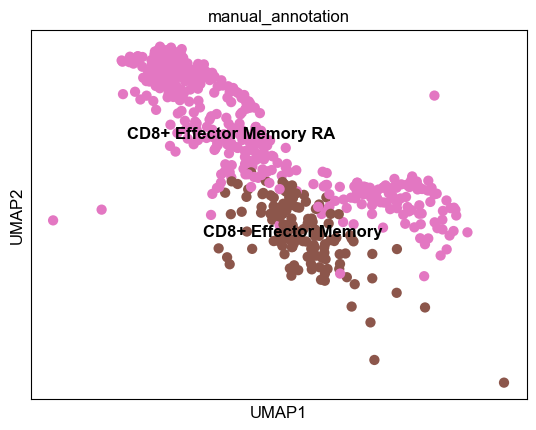

In [163]:
#update manual annotation in the sub 
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['0','2','3']), 'manual_annotation'] = 'CD8+ Effector Memory RA'
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['1']), 'manual_annotation'] = 'CD8+ Effector Memory'
# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['manual_annotation'], legend_loc='on data')

In [164]:
# Step 5: Map back to original adata
adata.obs.loc[adata_sub.obs_names, 'manual_annotation_reclustered'] = adata_sub.obs['manual_annotation'].astype(str)

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

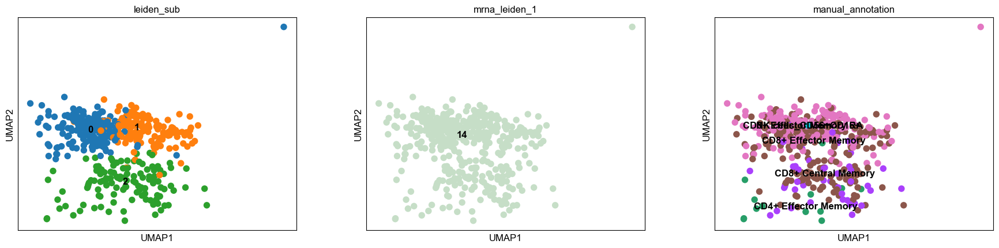

In [168]:
#take cluster for reclustring
subset_clusters = ['14']
adata_sub = adata[adata.obs['mrna_leiden_1'].isin(subset_clusters)].copy()
# Step 3: Reclustering with Leiden
sc.tl.leiden(adata_sub, resolution=0.3, key_added='leiden_sub')

# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['leiden_sub','mrna_leiden_1','manual_annotation'], legend_loc='on data')

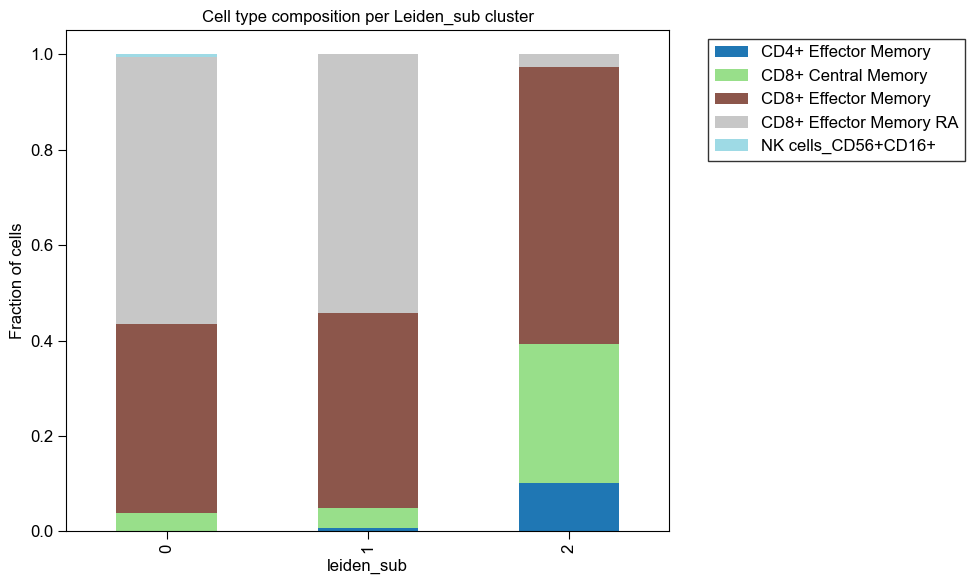

In [166]:
#check in the subcluster, the numbers of each cluster for each cell type
# Cross-tabulate: how cell types distribute across sub-Leiden clusters
ct = pd.crosstab(adata_sub.obs['leiden_sub'], adata_sub.obs['manual_annotation'], normalize='index')
ct.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.ylabel("Fraction of cells")
plt.title("Cell type composition per Leiden_sub cluster")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


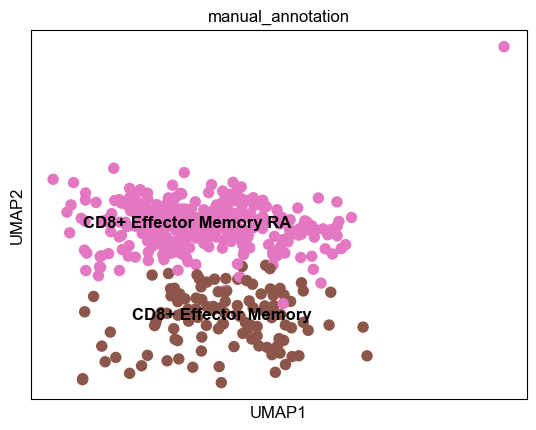

In [169]:
#update manual annotation in the sub 
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['0','1']), 'manual_annotation'] = 'CD8+ Effector Memory RA'
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['2']), 'manual_annotation'] = 'CD8+ Effector Memory'
# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['manual_annotation'], legend_loc='on data')

In [170]:
# Step 5: Map back to original adata
adata.obs.loc[adata_sub.obs_names, 'manual_annotation_reclustered'] = adata_sub.obs['manual_annotation'].astype(str)

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

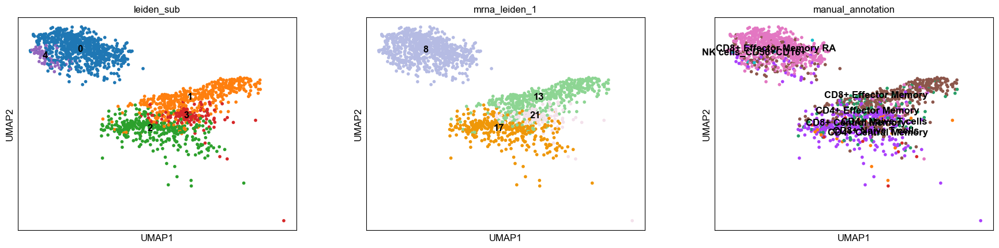

In [171]:
#take cluster for reclustring
subset_clusters = ['8', '13', '17', '21']
adata_sub = adata[adata.obs['mrna_leiden_1'].isin(subset_clusters)].copy()
# Step 3: Reclustering with Leiden
sc.tl.leiden(adata_sub, resolution=0.3, key_added='leiden_sub')

# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['leiden_sub','mrna_leiden_1','manual_annotation'], legend_loc='on data')

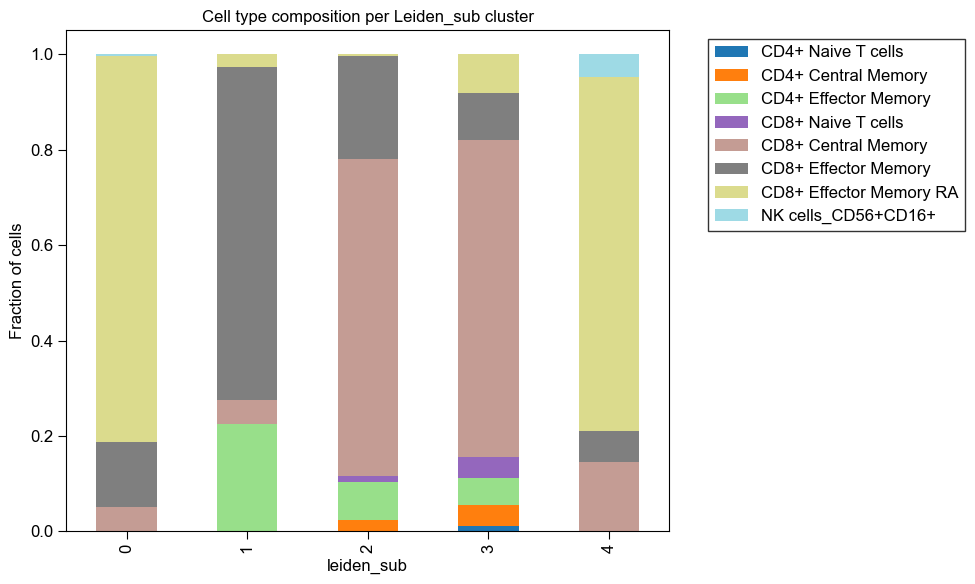

In [172]:
#check in the subcluster, the numbers of each cluster for each cell type
# Cross-tabulate: how cell types distribute across sub-Leiden clusters
ct = pd.crosstab(adata_sub.obs['leiden_sub'], adata_sub.obs['manual_annotation'], normalize='index')
ct.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.ylabel("Fraction of cells")
plt.title("Cell type composition per Leiden_sub cluster")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


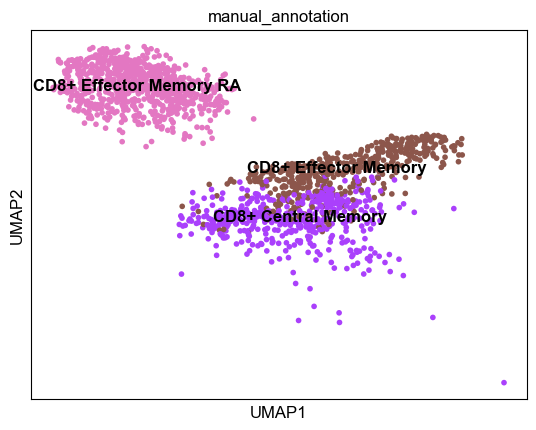

In [173]:
#update manual annotation in the sub 
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['0','4']), 'manual_annotation'] = 'CD8+ Effector Memory RA'
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['1']), 'manual_annotation'] = 'CD8+ Effector Memory'
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['2','3']), 'manual_annotation'] = 'CD8+ Central Memory'
# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['manual_annotation'], legend_loc='on data')

In [174]:
# Step 5: Map back to original adata
adata.obs.loc[adata_sub.obs_names, 'manual_annotation_reclustered'] = adata_sub.obs['manual_annotation'].astype(str)

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

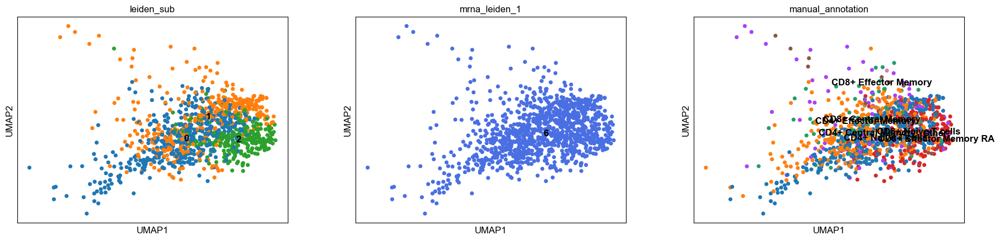

In [201]:
#take cluster for reclustring
subset_clusters = ['6']
adata_sub = adata[adata.obs['mrna_leiden_1'].isin(subset_clusters)].copy()
# Step 3: Reclustering with Leiden
sc.tl.leiden(adata_sub, resolution=0.2, key_added='leiden_sub')

# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['leiden_sub','mrna_leiden_1','manual_annotation'], legend_loc='on data')

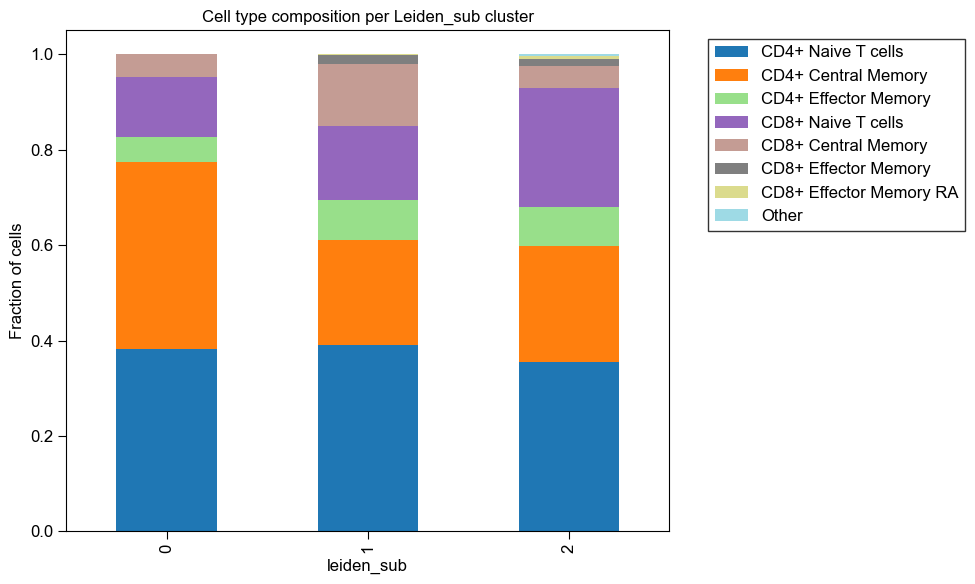

In [202]:
#check in the subcluster, the numbers of each cluster for each cell type
# Cross-tabulate: how cell types distribute across sub-Leiden clusters
ct = pd.crosstab(adata_sub.obs['leiden_sub'], adata_sub.obs['manual_annotation'], normalize='index')
ct.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.ylabel("Fraction of cells")
plt.title("Cell type composition per Leiden_sub cluster")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


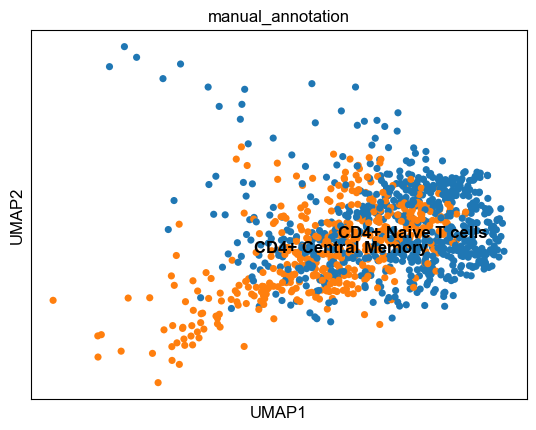

In [203]:
#update manual annotation in the sub 
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['0']), 'manual_annotation'] = 'CD4+ Central Memory'
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['1','2']), 'manual_annotation'] = 'CD4+ Naive T cells'
# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['manual_annotation'], legend_loc='on data')

In [204]:
# Step 5: Map back to original adata
adata.obs.loc[adata_sub.obs_names, 'manual_annotation_reclustered'] = adata_sub.obs['manual_annotation'].astype(str)

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

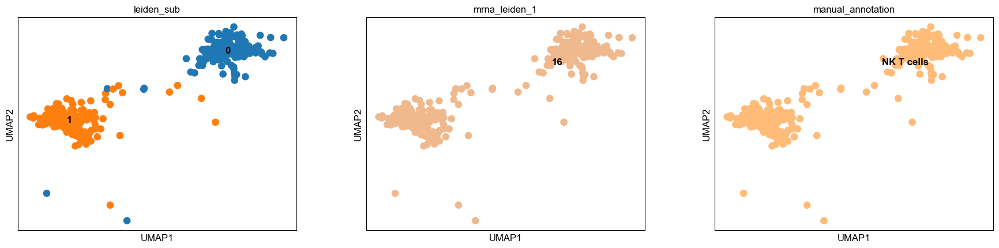

In [212]:
#take cluster for reclustring
subset_clusters = ['16']
adata_sub = adata[adata.obs['mrna_leiden_1'].isin(subset_clusters)].copy()
# Step 3: Reclustering with Leiden
sc.tl.leiden(adata_sub, resolution=0.1, key_added='leiden_sub')

# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['leiden_sub','mrna_leiden_1','manual_annotation'], legend_loc='on data')

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


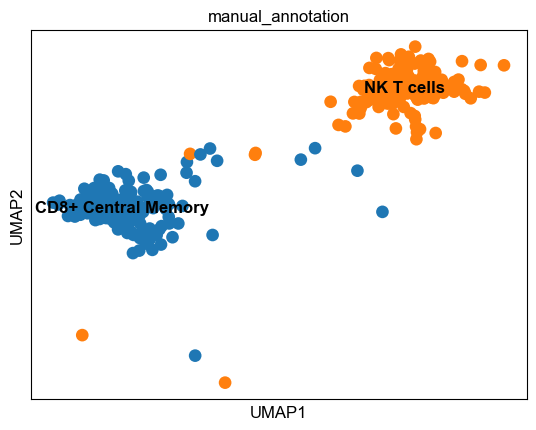

In [214]:
# Convert to string to allow flexible assignments
adata_sub.obs['manual_annotation'] = adata_sub.obs['manual_annotation'].astype(str)

# Now safely assign new values
adata_sub.obs.loc[adata_sub.obs['leiden_sub'] == '0', 'manual_annotation'] = 'NK T cells'
adata_sub.obs.loc[adata_sub.obs['leiden_sub'] == '1', 'manual_annotation'] = 'CD8+ Central Memory'

sc.pl.umap(adata_sub, color=['manual_annotation'], legend_loc='on data')

In [215]:
# Step 5: Map back to original adata
adata.obs.loc[adata_sub.obs_names, 'manual_annotation_reclustered'] = adata_sub.obs['manual_annotation'].astype(str)

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

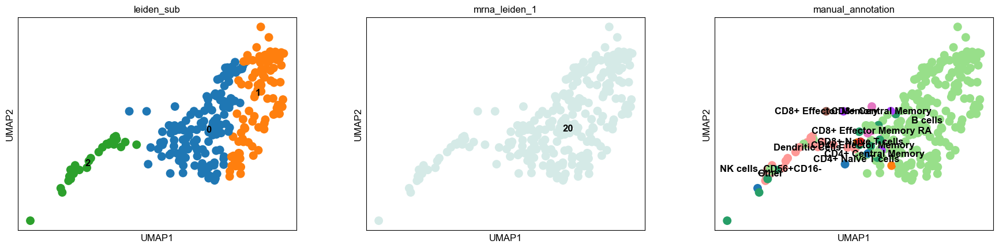

In [182]:
#take cluster for reclustring
subset_clusters = ['20']
adata_sub = adata[adata.obs['mrna_leiden_1'].isin(subset_clusters)].copy()
# Step 3: Reclustering with Leiden
sc.tl.leiden(adata_sub, resolution=0.2, key_added='leiden_sub')

# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['leiden_sub','mrna_leiden_1','manual_annotation'], legend_loc='on data')

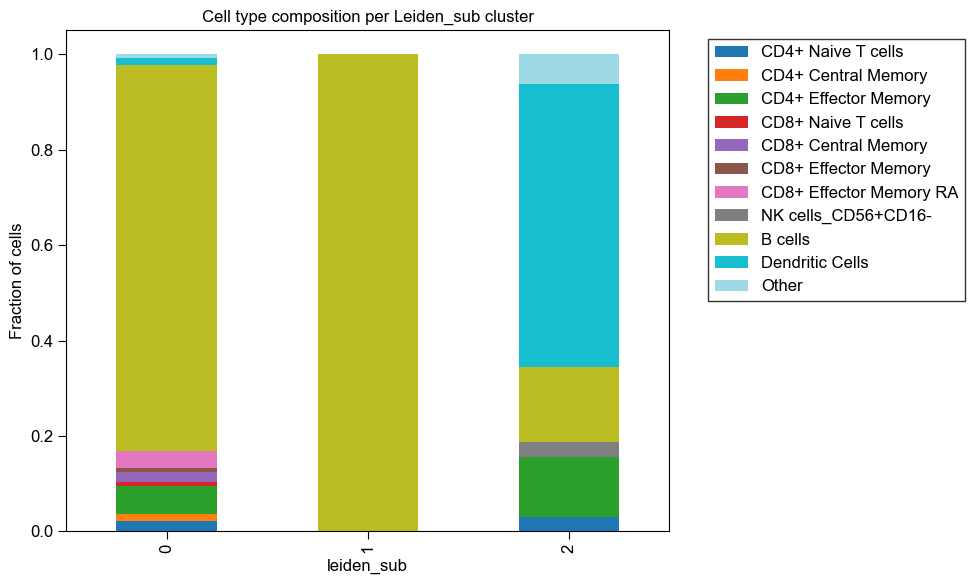

In [183]:
#check in the subcluster, the numbers of each cluster for each cell type
# Cross-tabulate: how cell types distribute across sub-Leiden clusters
ct = pd.crosstab(adata_sub.obs['leiden_sub'], adata_sub.obs['manual_annotation'], normalize='index')
ct.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.ylabel("Fraction of cells")
plt.title("Cell type composition per Leiden_sub cluster")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


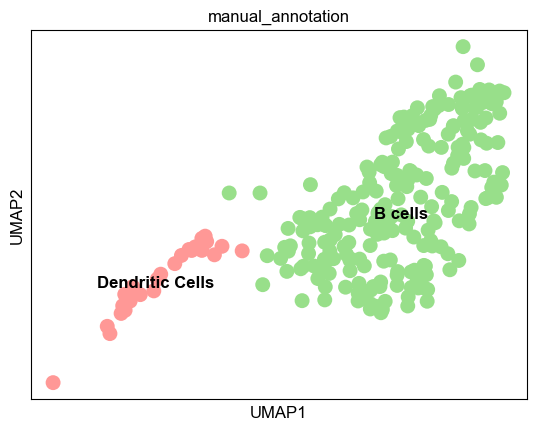

In [185]:
#update manual annotation in the sub 
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['0','1']), 'manual_annotation'] = 'B cells'
adata_sub.obs.loc[adata_sub.obs['leiden_sub'].isin(['2']), 'manual_annotation'] = 'Dendritic Cells'
# Step 4: Plot UMAP with reclustered labels
sc.pl.umap(adata_sub, color=['manual_annotation'], legend_loc='on data')

In [186]:
# Step 5: Map back to original adata
adata.obs.loc[adata_sub.obs_names, 'manual_annotation_reclustered'] = adata_sub.obs['manual_annotation'].astype(str)

In [187]:
#manually annotate 22 as Monocytes
subset_clusters = ['22']
adata_sub = adata[adata.obs['mrna_leiden_1'].isin(subset_clusters)].copy()

adata_sub.obs.loc[adata_sub.obs['mrna_leiden_1'].isin(['22']), 'manual_annotation'] = 'Monocytes'
# Step 5: Map back to original adata
adata.obs.loc[adata_sub.obs_names, 'manual_annotation_reclustered'] = adata_sub.obs['manual_annotation'].astype(str)

In [190]:
#manually annotate 22 as Others
subset_clusters = ['23']
adata_sub = adata[adata.obs['mrna_leiden_1'].isin(subset_clusters)].copy()

adata_sub.obs.loc[adata_sub.obs['mrna_leiden_1'].isin(['23']), 'manual_annotation'] = 'Other'
# Step 5: Map back to original adata
adata.obs.loc[adata_sub.obs_names, 'manual_annotation_reclustered'] = adata_sub.obs['manual_annotation'].astype(str)

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


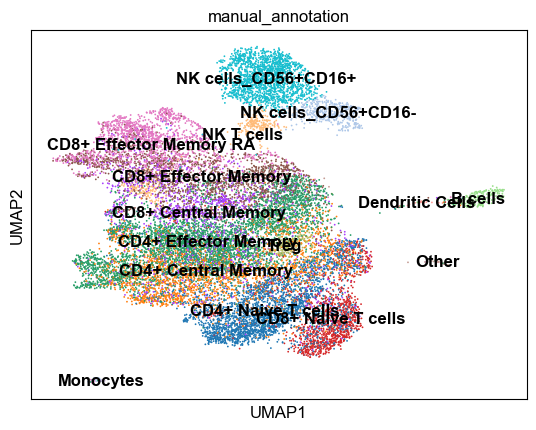

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


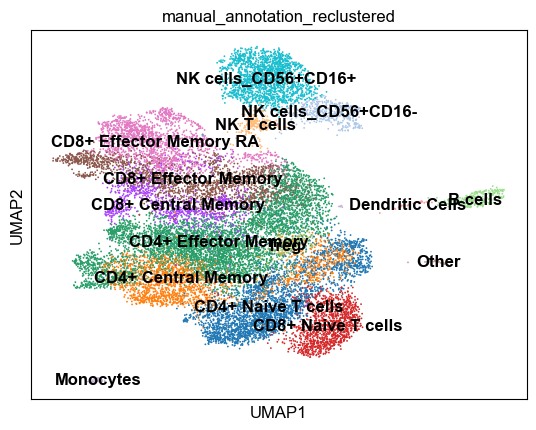

In [216]:
#plot after considering all clusters by reclustering
sc.pl.umap(adata, color=['manual_annotation'], legend_loc='on data')
sc.pl.umap(adata, color=['manual_annotation_reclustered'], legend_loc='on data')

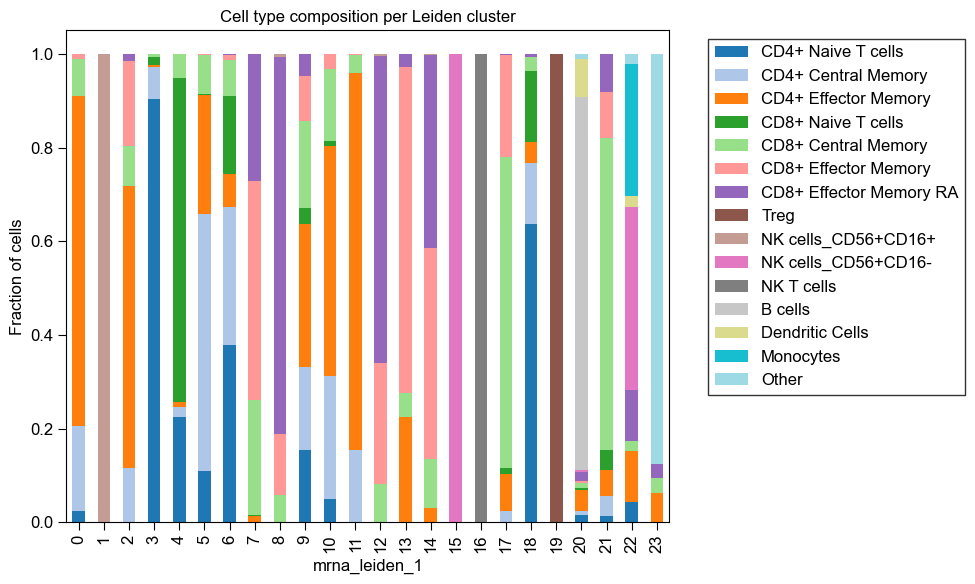

In [217]:
ct = pd.crosstab(adata.obs['mrna_leiden_1'], adata.obs['manual_annotation'], normalize='index')
ct.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.ylabel("Fraction of cells")
plt.title("Cell type composition per Leiden cluster")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

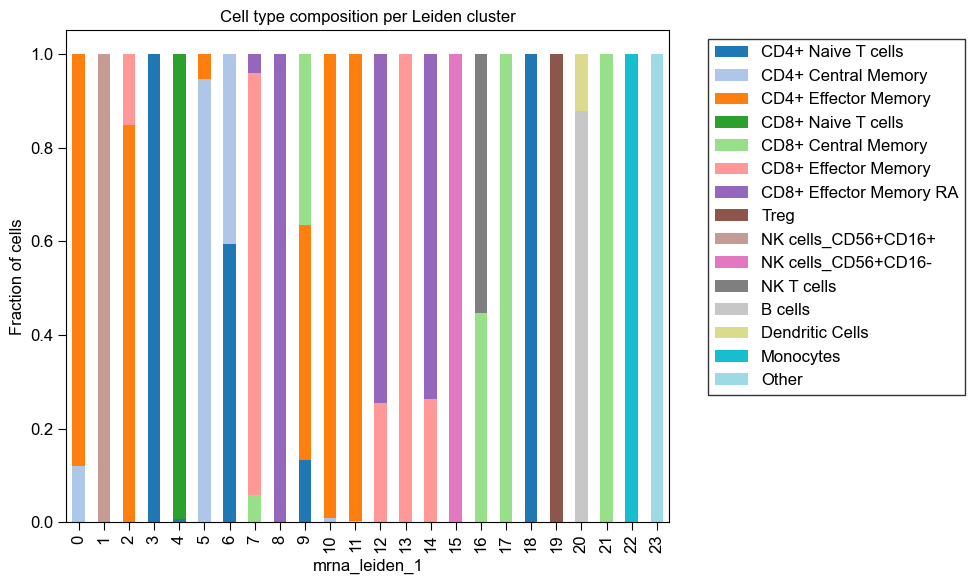

In [218]:
ct = pd.crosstab(adata.obs['mrna_leiden_1'], adata.obs['manual_annotation_reclustered'], normalize='index')
ct.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab20')
plt.ylabel("Fraction of cells")
plt.title("Cell type composition per Leiden cluster")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [223]:
# Define shared cytotoxic genes separately
cytotoxic_markers = ["PRF1", "GZMB", "NKG7", "GNLY"]

mrna_marker_dict_refined = {
    "Naive T": ["CCR7", "SELL", "TCF7", "LEF1"],
    "Memory T": ["IL7R", "ITGB1"],
    "Regulatory T": ["FOXP3"],
    "Cytotoxic Module": cytotoxic_markers,  # appear once
    "NK": ["NCAM1", "FCGR3A", "KLRD1"],  # exclude repeated cytotoxic markers
    "NKT": ["CD3D","NCAM1"],             # also avoid overlap
    "B": ["MS4A1", "CD79A"],
    "Monocytes": ["CD14", "LYZ", "S100A8", "S100A9"],
    "DCs": ["LAMP3", "CD74", "HLA-DPA1"]
}

In [ ]:
sc.pl.dotplot(adata, mrna_marker_dict_refined, groupby="manual_annotation", standard_scale='var', cmap='Blues')

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' 

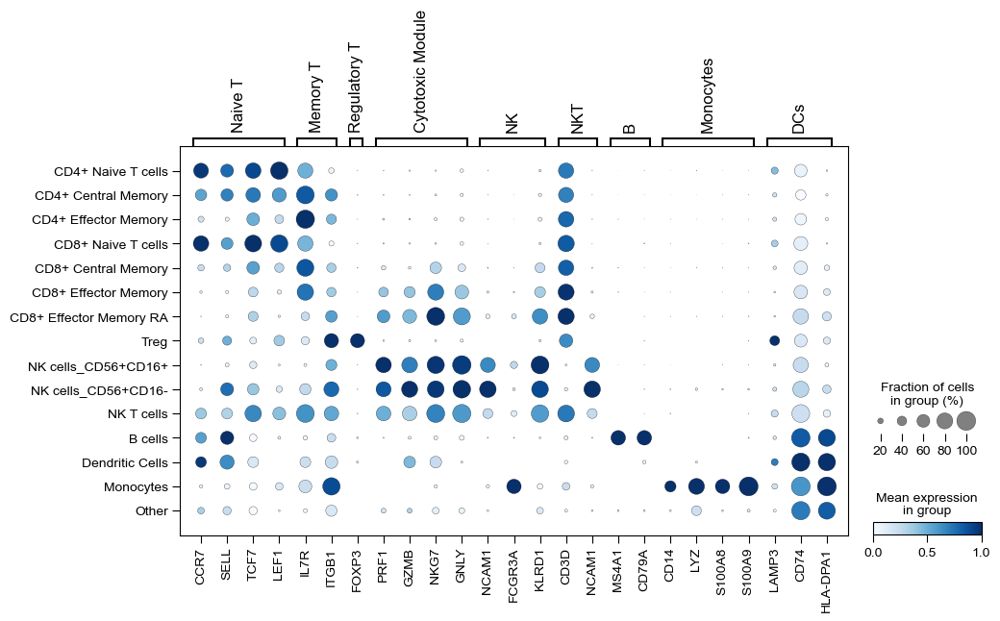

In [226]:
sc.pl.dotplot(adata_ctrl, mrna_marker_dict_refined, groupby="manual_annotation", standard_scale='var', cmap='Blues')

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

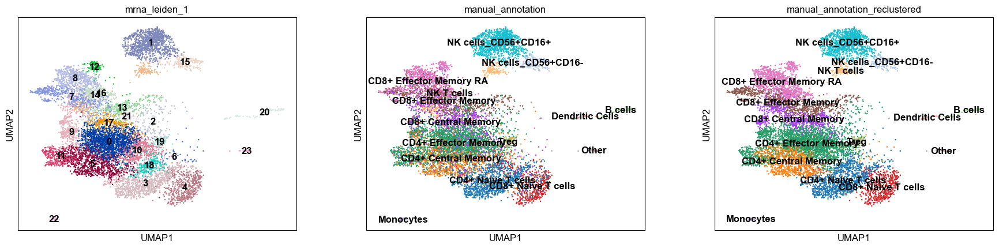

In [222]:
# Subset to control cells
adata_ctrl = adata[adata.obs['condition'] == 'control'].copy()

# Plot UMAP colored by clustering
sc.pl.umap(adata_ctrl, color=['mrna_leiden_1', 'manual_annotation','manual_annotation_reclustered'], legend_loc='on data')

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


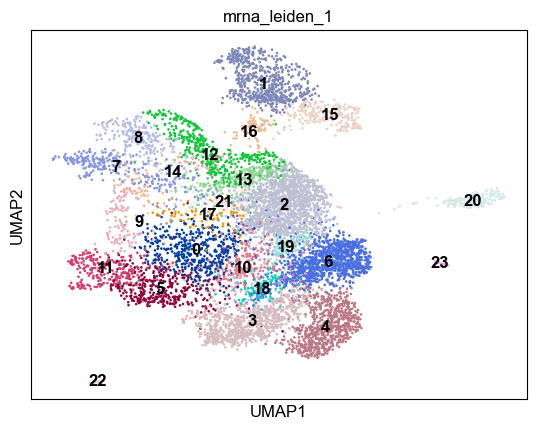

In [55]:
# Subset to control cells
adata_sti = adata[adata.obs['condition'] == 'stimulated'].copy()

# Plot UMAP colored by clustering
sc.pl.umap(adata_sti, color=['mrna_leiden_1'], legend_loc='on data')

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


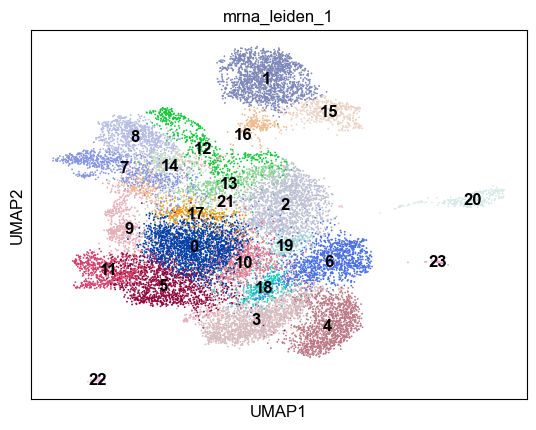

In [37]:
sc.pl.umap(adata, color=['mrna_leiden_1'], legend_loc='on data')

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


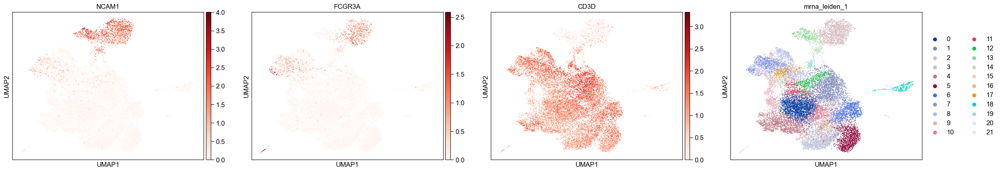

In [27]:
#check NK marker genes
nk_markers = [
    "NCAM1",   # CD56
    "FCGR3A",  # CD16
    'CD3D',
    "mrna_leiden_1"
]
sc.pl.umap(adata, color=nk_markers, cmap="Reds")

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


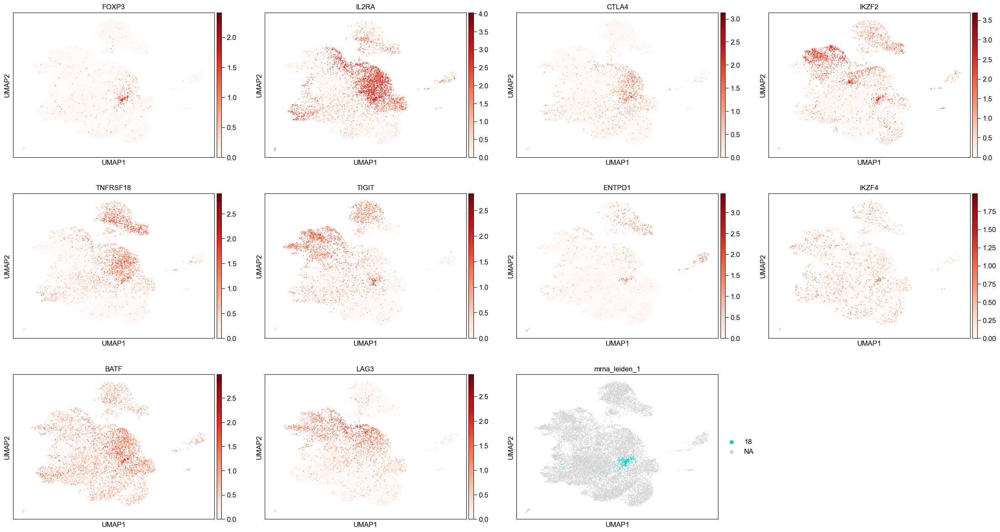

In [24]:
#check Treg marker genes
treg_markers = [
    "FOXP3",     # Master transcription factor for Treg identity
    "IL2RA",     # CD25 — high expression on Tregs
    "CTLA4",     # Immune checkpoint molecule, highly expressed in Tregs
    "IKZF2",     # Helios — nuclear marker, enriched in thymic Tregs
    "TNFRSF18",  # GITR — activation and survival
    "TIGIT",     # Co-inhibitory receptor, high in Tregs
    "ENTPD1",    # CD39 — immunosuppressive ectonucleotidase
    "IKZF4",     # Eos — transcription factor associated with Treg function
    "BATF",      # Transcriptional regulator, active in Tregs
    "LAG3",      # Inhibitory receptor, upregulated in suppressive Tregs
    "mrna_leiden_1",
]
sc.pl.umap(adata, color=treg_markers, groups=['18'],cmap="Reds")

In [29]:
#manual adjsutment based on canonical markers
cluster2annotation = {
    '16': 'NK T cells',
    '1': 'NK cells_CD56+CD16+',
    '15': 'NK cells_CD56+CD16-',
    '19': 'Treg',
}
# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
adata.obs['manual_annotation'] = adata.obs['mrna_leiden_1'].map(cluster2annotation)
# Step 2: Fill remaining cells with SingleR annotation
adata.obs['manual_annotation'] = adata.obs['manual_annotation'].fillna(adata.obs['singler_ann_l2'])
adata.obs['manual_annotation'] = adata.obs['manual_annotation'].astype('category')

In [30]:
adata.obs['manual_annotation']

AAACCCAAGCACCTGC-1    CD8+ Effector Memory RA
AAACCCAAGCATCCTA-1        CD4+ Central Memory
AAACCCAAGTGTTGTC-1       CD4+ Effector Memory
AAACCCACACCATTCC-1         Naive CD4+ T cells
AAACCCACATAATCCG-1        CD8+ Central Memory
                               ...           
TTTGTTGGTTGTACGT-1        CD4+ Central Memory
TTTGTTGGTTTGTTGG-1        CD4+ Central Memory
TTTGTTGTCCTTGACC-1         Naive CD4+ T cells
TTTGTTGTCGCCGATG-1    CD8+ Effector Memory RA
TTTGTTGTCGGTGTAT-1    CD8+ Effector Memory RA
Name: manual_annotation, Length: 18055, dtype: category
Categories (18, object): ['B cells', 'CD4+ Central Memory', 'CD4+ Effector Memory', 'CD8+ Central Memory', ..., 'Naive CD4+ T cells', 'Naive CD8+ T cells', 'Other', 'Treg']

In [31]:
#rename cell cluster
adata.obs['manual_annotation'] = adata.obs['manual_annotation'] .replace({
    'Mature NK cells_CD56- CD16+ CD3-': 'NK cells_CD56+CD16-',
    'Mature NK cells_CD56+ CD16+ CD3-': 'NK cells_CD56+CD16+',
    'Mature NK cells_CD56- CD16- CD3-': 'Other',
    'Naive CD4+ T cells': 'CD4+ Naive T cells',
    'Naive CD8+ T cells': 'CD8+ Naive T cells'
})

# Define your desired order of categories
desired_order = [
    'CD4+ Naive T cells',
    'CD4+ Central Memory',
    'CD4+ Effector Memory',
    'CD8+ Naive T cells',
    'CD8+ Central Memory',
    'CD8+ Effector Memory',
    'CD8+ Effector Memory RA',
    'Treg',
    'NK cells_CD56+CD16+',
    'NK cells_CD56+CD16-',
    'NK T cells',
    'B cells',
    'Dendritic Cells',
    'Monocytes',
    'Other']
present_cats = [cat for cat in desired_order if cat in adata.obs['manual_annotation'].unique()]

# Reorder categories
adata.obs['manual_annotation'] = adata.obs['manual_annotation'].astype(
    pd.api.types.CategoricalDtype(categories=present_cats, ordered=True)
)

/var/folders/3m/mdf183dx4b79fpz1v51zf93w0000gn/T/ipykernel_75631/3412801519.py:2: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['manual_annotation'] = adata.obs['manual_annotation'] .replace({


In [32]:
sc.tl.leiden(adata, resolution = 0.8, key_added='mrna_leiden_0.8') # resolution is customly chosen

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_

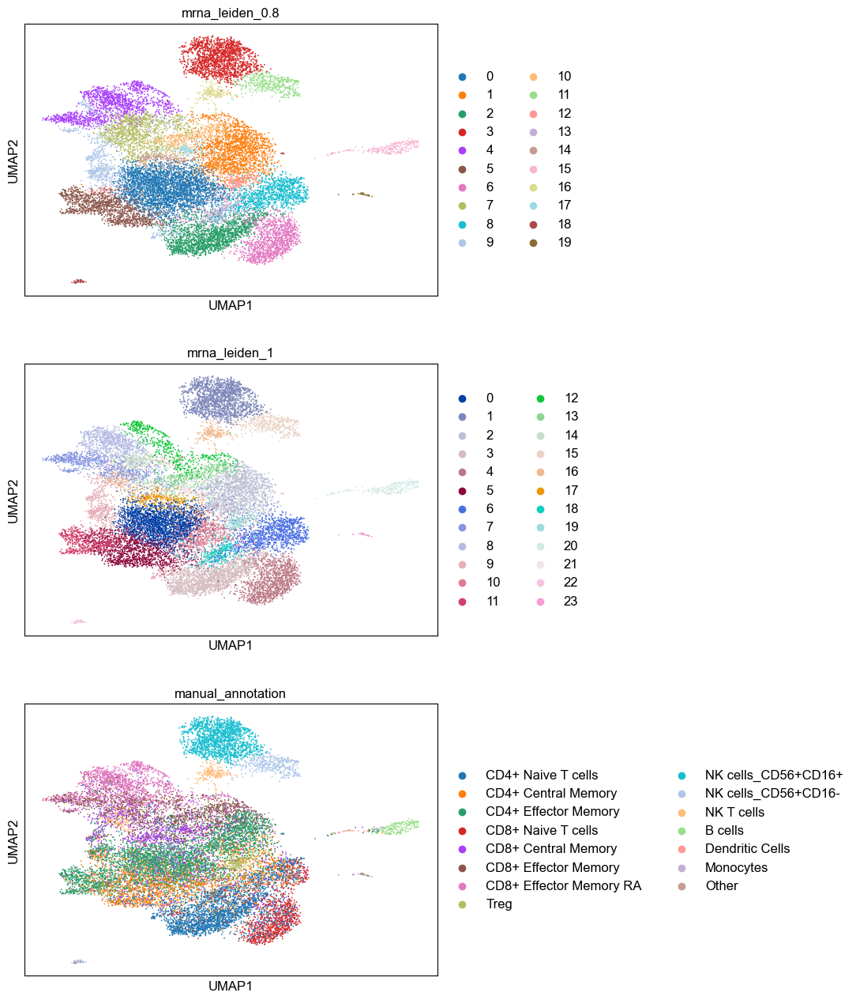

In [33]:
sc.pl.umap(adata, color=['mrna_leiden_0.8','mrna_leiden_1','manual_annotation'], ncols=1)

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


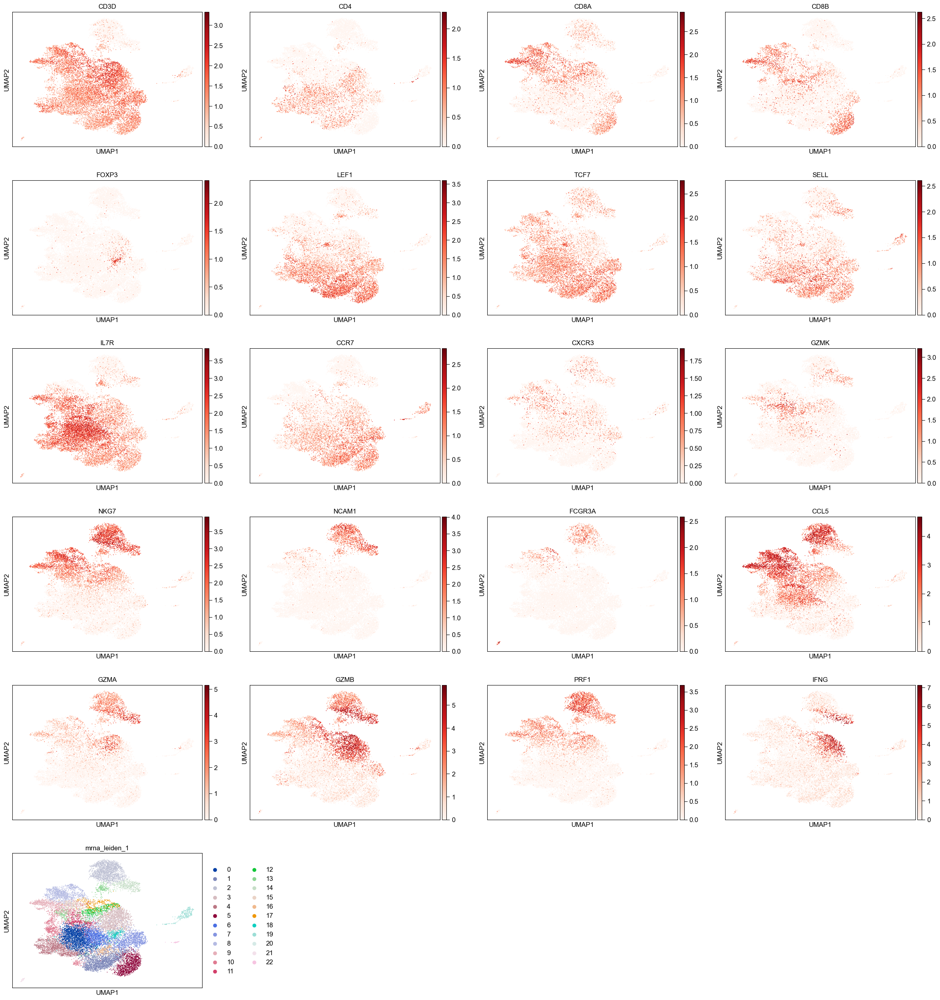

In [84]:
sc.pl.umap(adata, color=['CD3D','CD4','CD8A','CD8B','FOXP3','LEF1', 'TCF7', 'SELL','IL7R','CCR7','CXCR3','GZMK', 'NKG7','NCAM1','FCGR3A','CCL5','GZMA', 'GZMB','PRF1','IFNG','mrna_leiden_1'], cmap="Reds")

In [72]:
marker_genes_dict = {
    "CD4+ Naive T cells": ["CCR7", "LEF1"],
    "CD4+ Central Memory": ["CCR7", "IL7R", "CD27"],
    "CD4+ Effector Memory": ["IL7R", "GZMK"],
    "CD8+ Naive T cells": ["CD8A", "CCR7", "SELL", "TCF7"],
    "CD8+ Central Memory": ["CD8A", "CCR7", "IL7R"],
    "CD8+ Effector Memory": ["CD8A", "GZMK"],
    "CD8+ Effector Memory RA": ["CD8A", "KLRG1", "FGFBP2"],
    "Treg": ["FOXP3", "IL2RA", "CTLA4", "IKZF2"],
    "NK cells_CD56+CD16+": ["NCAM1", "FCGR3A", "PRF1", "GZMB", "NKG7"],
    "NK cells_CD56+CD16-": ["NCAM1", "XCL1", "XCL2", "KLRD1", "KLRC1"],
    "NK T cells": ["NCAM1","ZBTB16"],
    "B cells": ["CD19", "MS4A1", "CD79A"],
    "Dendritic Cells": ["CD1C", "CLEC9A"],
    "Monocytes": ["LYZ", "CD14", "FCGR3A", "S100A9"],
}

categories: CD4+ Naive T cells, CD4+ Central Memory, CD4+ Effector Memory, etc.
var_group_labels: CD4+ Naive T cells, CD4+ Central Memory, CD4+ Effector Memory, etc.


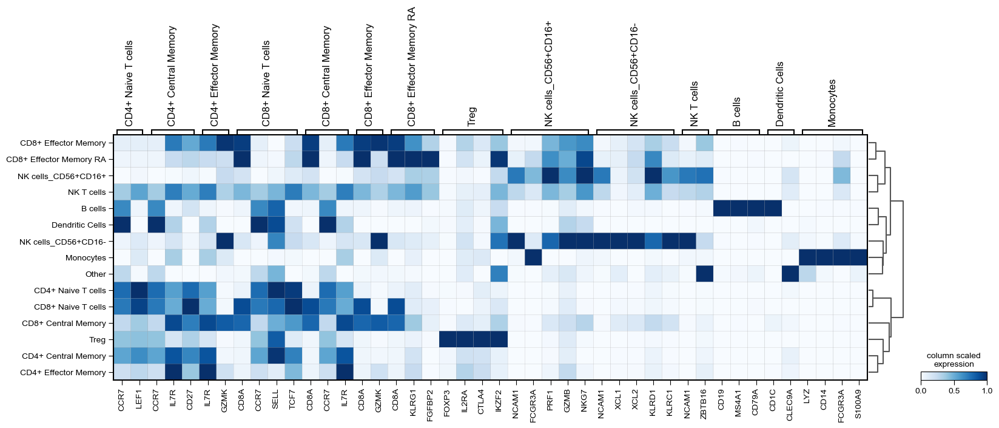

In [73]:
sc.pl.matrixplot(adata, marker_genes_dict, 'manual_annotation', dendrogram=True,    
                 cmap="Blues", standard_scale="var", colorbar_title="column scaled\nexpression")

/Users/junjie/anaconda3/envs/scanpy_Prox-seq/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


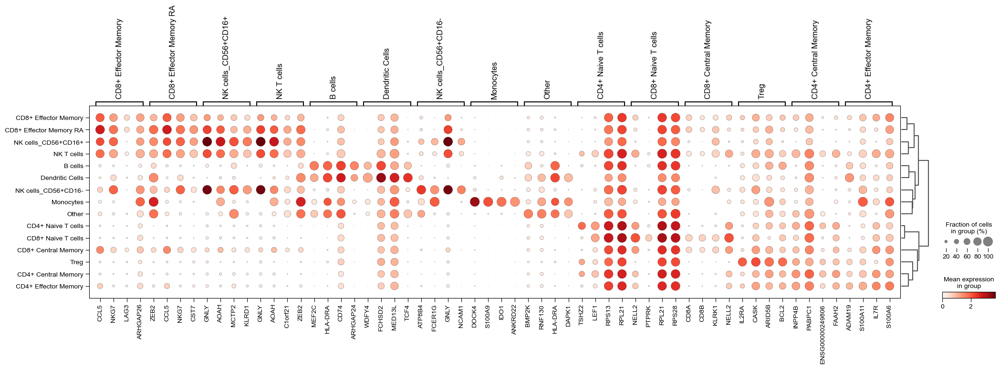

In [55]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=4)